# AS4501 - spatial analysis
Francisco Förster Burón (UChile) and Ryan Trainor (F&M)

# Bibliography:

* Feigelson & Babu Chapter 12, Ivezic et al. Chapter 2

* Ivezic. Connolly, VanderPlas, & Gray. Section 2.5

# Load modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
from scipy.interpolate import interp1d

# Spatial data

* Data points in  𝑝  spatial dimensions, with  𝑝=2  or  3 
* Most common problem in astronomy: distribution of galaxies in 2D and 3D (clusters)
* 3D information requires distance estimation

# Point processes:
* set of irregular patterns of points in $p$-dimensional space
* stationary: invariant under spatial translation
* isotropic: invariant under rotation

## Intensity

The **Intensity** of a stationary point process is $\lambda$, where
$$E[N] = \lambda \nu_p$$
with $\nu_p$ a unit of volume of $p$-space

## Poisson point process
In a **Poisson point process** the distribution of counts per unit volume follows a Poisson distribution:
$$N \sim \textrm{Poisson}(\lambda \nu_p)$$

## Poisson distributed random variable
In a **Poisson distributed random variable**, the probability of $k$ discrete events given $\mu$ expected events is $$P(k) = \frac{\mu^k e^k}{k!}$$

Let's compare Poisson with mean and variance $\lambda=1, 10, 100, 10000$ and Gaussian distributions with the same mean and variance with a sample size of 1000.

Poisson: mean=    0.981 var=    1.007
Normal:  mean=    0.981 var=    1.031

Poisson: mean=   10.077 var=    8.959
Normal:  mean=   10.021 var=   10.298

Poisson: mean=  100.163 var=  107.438
Normal:  mean=   99.829 var=  100.371

Poisson: mean= 1000.949 var=  972.104
Normal:  mean= 1001.034 var=  982.104



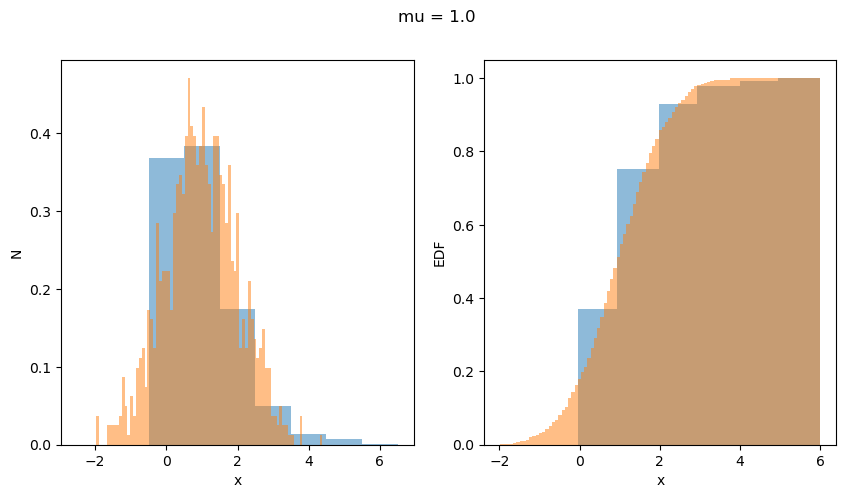

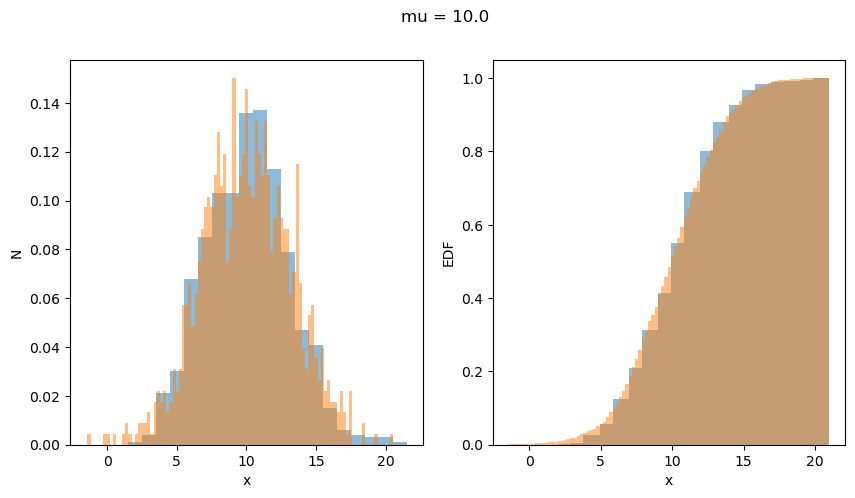

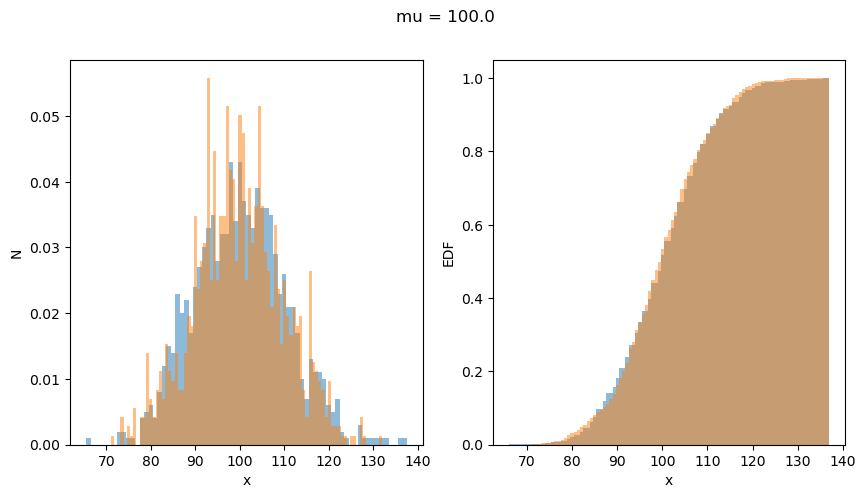

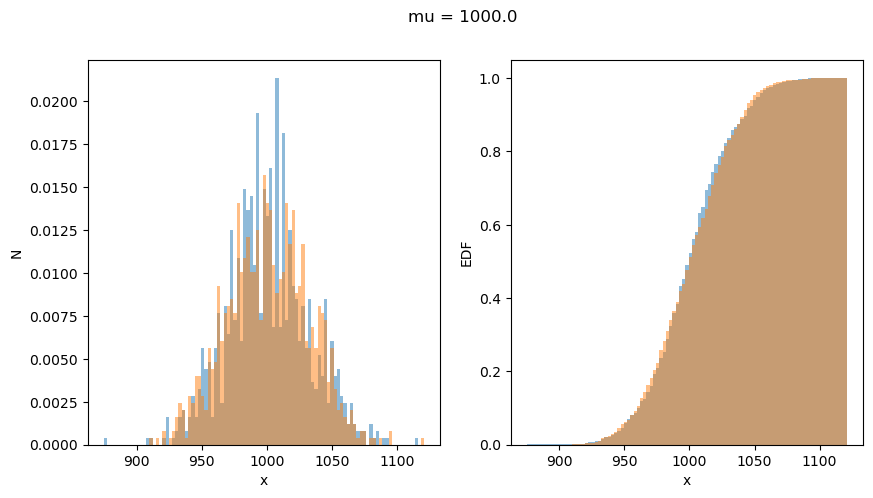

In [3]:
from scipy.stats import poisson, norm
def compPoissonNormal(mu, size):
    fig, axs = plt.subplots(ncols=2,figsize=(10,5));
    rvP = poisson(mu)
    rvN = norm(mu, np.sqrt(mu))
    Pvs = rvP.rvs(size = size)
    Nvs = rvN.rvs(size = size)
    print(f"Poisson: mean={np.average(Pvs):9.3f} var={np.std(Pvs)**2:9.3f}")
    print(f"Normal:  mean={np.average(Nvs):9.3f} var={np.std(Nvs)**2:9.3f}\n")
    
    bins = np.linspace(np.min(np.append(Pvs,Nvs)),np.max(np.append(Pvs,Nvs)),100)
    if bins[1]-bins[0]<1:
        pbins = np.arange(np.round(np.min(np.append(Pvs,Nvs)))-0.5,np.max(np.append(Pvs,Nvs))+1,1)
    else: pbins = bins
    
    axs[0].hist(Pvs, bins = pbins, density = True, alpha = 0.5, lw = 0)
    axs[0].hist(Nvs, bins = bins, density = True, alpha = 0.5, lw = 0)
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("N")

    axs[1].hist(Pvs, bins = bins, density = True, alpha = 0.5, cumulative = True, lw = 0)
    axs[1].hist(Nvs, bins = bins, density = True, alpha = 0.5, cumulative = True, lw = 0)
    axs[1].set_xlabel("x")
    axs[1].set_ylabel("EDF")
    fig.suptitle("mu = %.1f" % mu)
    
compPoissonNormal(1, 1000)
compPoissonNormal(10, 1000)
compPoissonNormal(100, 1000)
compPoissonNormal(1000, 1000)

## Complete spatial randomness (CSR)

**Complete spatial randomness (CSR)** is a **stationary Poisson process** where **$\lambda$ is constant** across space

## Inhomogeneous Poisson point process
An **inhomogeneous Poisson point process** occurs when $\lambda({\bf x})$ varies with location

## Marked point process
A **marked point process** is spatial data with associated non-spatial variables (*e.g. luminosity*)

# Uniformity tests

## G test

* Complete spatial randomness (CSR) hypotesis testing: compare **nearest-neighbor** empirical distribution function $G(r)$

* The CSR distribution for a two-dimensional area A and for large $n$ is: 
$$ \Large G_{CSR}(r) = 1 - e^{-\pi n r^2 / A}$$


* simulations needed for edge effects and small $n$.

Build a two dimensional CSR sample and perform an uniformity G test.

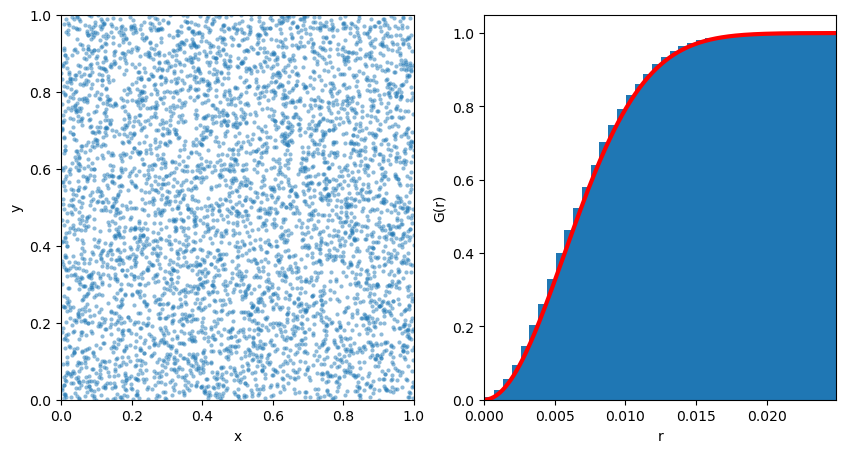

In [4]:
n = 5000
(x, y) = (np.random.random([n]), np.random.random([n]))

def Gtest(x, y, A):

    # find nearest neighbor distance
    nnG = np.array(list(map(lambda i: min(np.sqrt((np.delete(x, i) - x[i])**2
        + (np.delete(y, i) - y[i])**2)), range(len(x)))))
    
    # do scatter plot and compare e.d.f. with CSR

    fig, ax = plt.subplots(ncols=2, figsize = (10, 5))
    ax[0].scatter(x, y, marker = '.', lw = 0, alpha = 0.5); ax[0].set_xlabel('x'); ax[0].set_ylabel('y'); 
    ax[0].set_xlim(0,1); ax[0].set_ylim(0,1);
    ax[1].hist(nnG, cumulative = True, density = True, bins = 40, lw  = 0);

    r = np.linspace(0, 1, 10000);
    ax[1].plot(r, 1.- np.exp(-np.pi * n * r**2 / A), lw = 3, c = 'r'); 
    ax[1].set_xlabel('r'); ax[1].set_ylabel('G(r)');
    ax[1].set_xlim(0, max(nnG));

    return nnG

nnG = Gtest(x, y, 1)

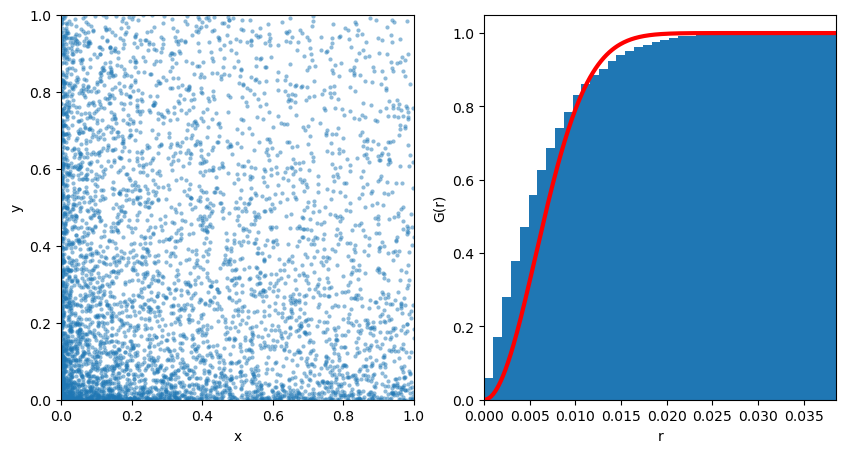

In [5]:
# non-CSR case

x2 = x**2; y2 = y**2;
nnG2 = Gtest(x2, y2, 1)

## F test

* similar to $G(r)$, but using distance from set of random locations

Build a two dimensional CSR sample and perform an uniformity F test.

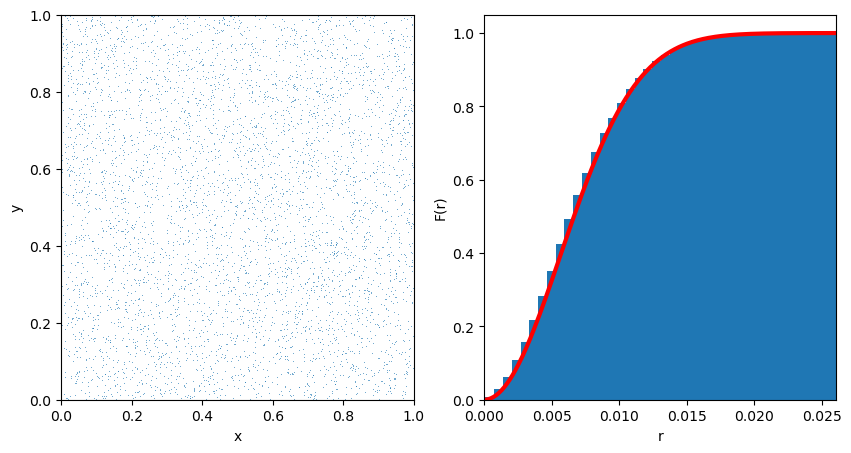

In [6]:
n = 5000
(x, y) = (np.random.random([n]), np.random.random([n]))

def Ftest(x, y, ntest):

    nnF = np.array(list(map(lambda i: min(np.sqrt((x - np.random.random())**2
        + (y - np.random.random())**2)), range(ntest))))
    
    fig, ax = plt.subplots(ncols=2, figsize = (10, 5))
    ax[0].scatter(x, y, marker = '.', lw = 0, alpha = 0.5, s = 2); ax[0].set_xlabel('x'); ax[0].set_ylabel('y'); 
    ax[0].set_xlim(0,1); ax[0].set_ylim(0,1);
    ax[1].hist(nnF, cumulative = True, density = True, bins = 40, lw  = 0);

    r = np.linspace(0, 1, 10000);
    ax[1].plot(r, 1.- np.exp(-np.pi * np.size(x) * r**2), lw = 3, c = 'r'); 
    ax[1].set_xlabel('r'); ax[1].set_ylabel('F(r)');
    ax[1].set_xlim(0, max(nnF));
    
    return nnF
    
nnF = Ftest(x, y, 10000)

# Test on GAIA catalogue of stars

GAIA catalogue
http://gea.esac.esa.int/archive/

Astropy to read Virtual Observatory Tables (VOT)
http://www.astropy.org/

In [8]:
from astropy.table import Table

T = Table.read("data/test_GAIA.vot", format='votable')

In [9]:
print(T.keys())

['solution_id', 'source_id', 'random_index', 'ref_epoch', 'ra', 'ra_error', 'dec', 'dec_error', 'parallax', 'parallax_error', 'pmra', 'pmra_error', 'pmdec', 'pmdec_error', 'ra_dec_corr', 'ra_parallax_corr', 'ra_pmra_corr', 'ra_pmdec_corr', 'dec_parallax_corr', 'dec_pmra_corr', 'dec_pmdec_corr', 'parallax_pmra_corr', 'parallax_pmdec_corr', 'pmra_pmdec_corr', 'astrometric_n_obs_al', 'astrometric_n_obs_ac', 'astrometric_n_good_obs_al', 'astrometric_n_good_obs_ac', 'astrometric_n_bad_obs_al', 'astrometric_n_bad_obs_ac', 'astrometric_delta_q', 'astrometric_excess_noise', 'astrometric_excess_noise_sig', 'astrometric_primary_flag', 'astrometric_relegation_factor', 'astrometric_weight_al', 'astrometric_weight_ac', 'astrometric_priors_used', 'matched_observations', 'duplicated_source', 'scan_direction_strength_k1', 'scan_direction_strength_k2', 'scan_direction_strength_k3', 'scan_direction_strength_k4', 'scan_direction_mean_k1', 'scan_direction_mean_k2', 'scan_direction_mean_k3', 'scan_directio

We cannot run the F test routine from above on a circular area because it simulates points in a squared area, therefore we force our area to be squared and of dimensions 1 x 1:

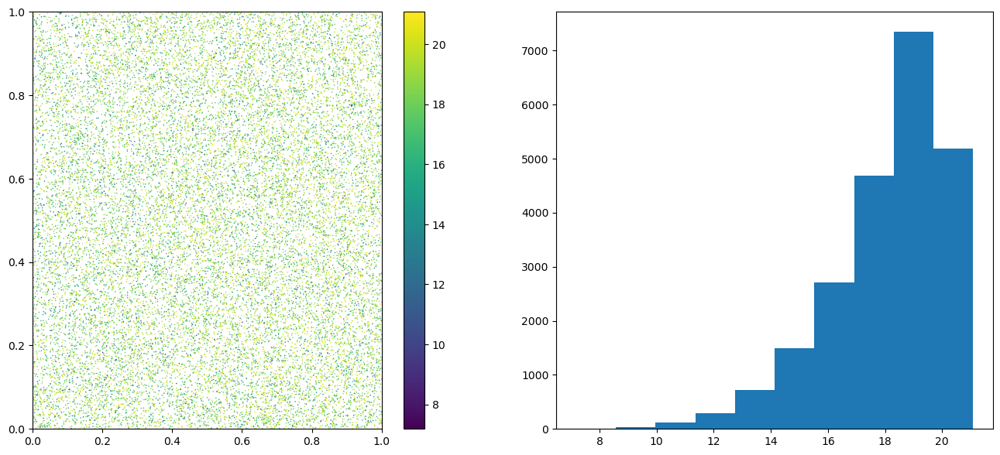

In [10]:
# sql string
ra = 11 * 15 # 11 hr
dec = -5 # -5 deg
radius = 2 # 2 deg
GAIA_ra = T['ra']
GAIA_dec = T['dec']
GAIA_g = T['phot_g_mean_mag']
fig, ax = plt.subplots(ncols = 2, figsize = (16, 7))
mask = (np.abs(GAIA_ra - ra) < radius / np.sqrt(2)) & (np.abs(GAIA_dec - dec) < radius / np.sqrt(2))
GAIA_ra = GAIA_ra[mask]
GAIA_dec = GAIA_dec[mask]
GAIA_g = GAIA_g[mask]
xGAIA = np.array((GAIA_ra - min(GAIA_ra)) / (max(GAIA_ra) - min(GAIA_ra)))
yGAIA = np.array((GAIA_dec - min(GAIA_dec)) / (max(GAIA_dec) - min(GAIA_dec)))
cax = ax[0].scatter(xGAIA, yGAIA, c = GAIA_g, marker = '.', lw = 0, s = 5)
plt.colorbar(cax)
ax[0].set_xlim(0, 1)
ax[0].set_ylim(0, 1)
_ = ax[1].hist(GAIA_g)

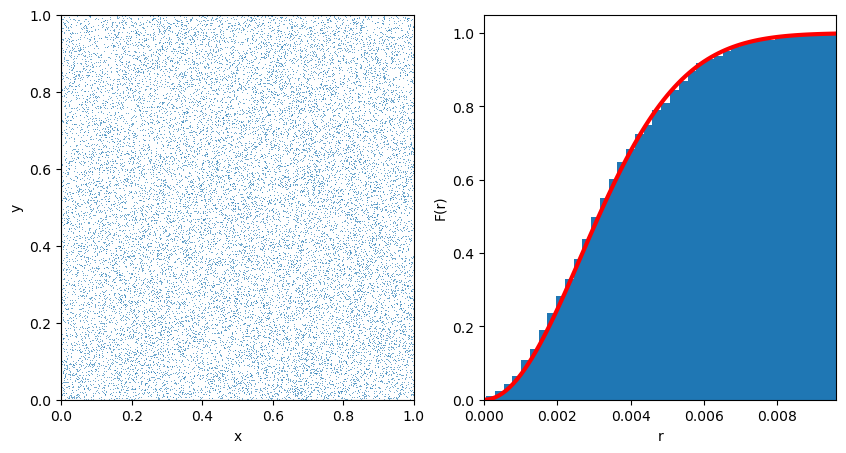

In [11]:
_ = Ftest(xGAIA, yGAIA, 1000)

It appears that the stars in this region of the GAIA catalogue follow a CSR distribution

Let's now try a catalogue of galaxies

http://magnum.anu.edu.au/~TDFgg/

![alt text](images/2dFzcone.gif "2dF")

(-7.499777777777778, 2.4999722222222225)

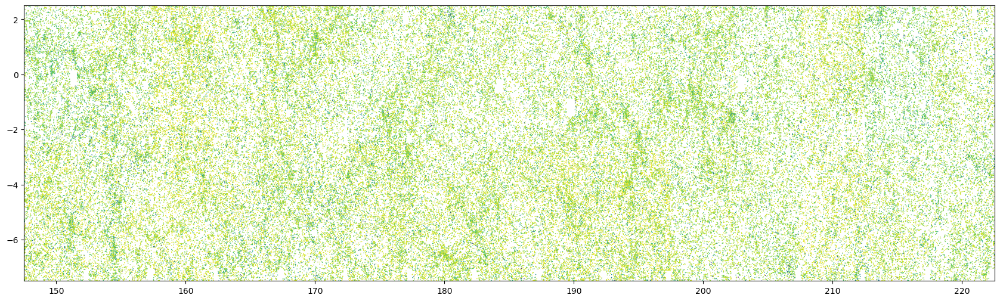

In [13]:
#(rahh, ramm, rass, decdd, decmm, decss, z2df) = np.loadtxt("best.observations.idz", usecols = (10,11, 12, 13, 14, 15, 20), dtype = str).transpose()
(rahh, ramm, rass, decdd, decmm, decss, mag2df) = np.loadtxt("data/ngp.cat", usecols = (1, 2, 3, 4, 5, 6, 7), dtype = str).transpose()
ra2df = (np.array(rahh, dtype = float) + (np.array(ramm, dtype = float) + np.array(rass, dtype = float) / 60.) / 60.) * 15.
neg = np.array(list(map(lambda x: x[0] == '-', decdd)))
dec2df = (np.abs(np.array(decdd, dtype = float)) + (np.array(decmm, dtype = float) + np.array(decss, dtype = float) / 60.) / 60.)
dec2df[neg] = -dec2df[neg]
mag2df = np.array(mag2df, dtype = float)
fig, ax = plt.subplots(figsize = (21, 6))
ax.scatter(ra2df, dec2df, c = mag2df, marker = '.', s = 5, lw = 0, alpha = 1)
ax.set_xlim(min(ra2df), max(ra2df))
ax.set_ylim(min(dec2df), max(dec2df))

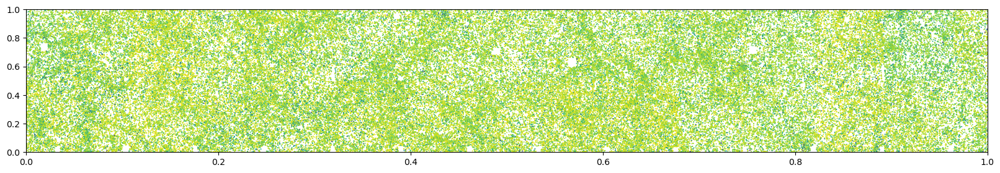

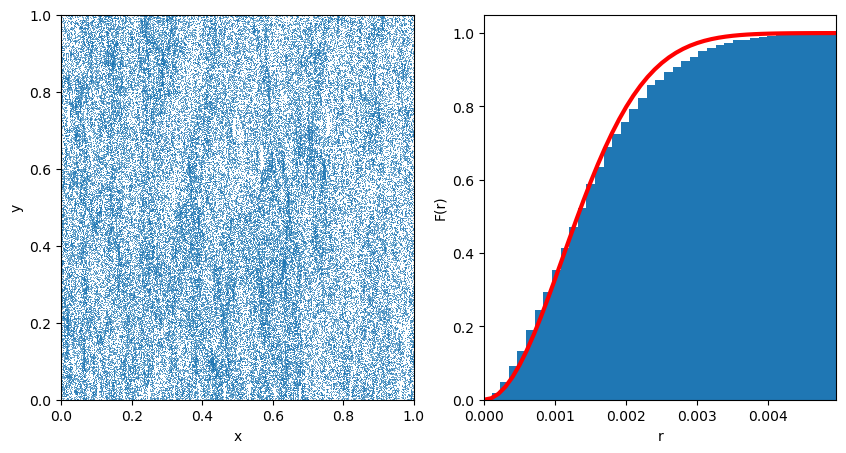

In [14]:
mask = (ra2df > 150) & (ra2df < 220)
ra2df = ra2df[mask]
dec2df = dec2df[mask]
mag2df = mag2df[mask]
x2df = (ra2df - min(ra2df)) / (max(ra2df) - min(ra2df))
y2df = (dec2df - min(dec2df)) / (max(dec2df) - min(dec2df))
fig, ax = plt.subplots(figsize = (20, 3))
ax.scatter(x2df, y2df, c = mag2df, marker = 'o', s = 2, lw = 0, alpha = 1)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
nn2df = Ftest(x2df, y2df, 1000)

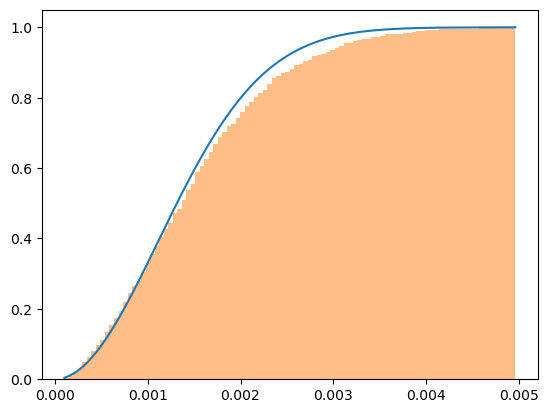

In [15]:
nn2df = np.sort(np.array(nn2df))
def cdfCSR(r):
    return 1.- np.exp(-np.pi * np.size(x2df) * r**2)
fig, ax = plt.subplots()
ax.plot(nn2df, cdfCSR(nn2df))
ax.hist(nn2df, density = True, cumulative = True, alpha = 0.5, bins = 100);

In [16]:
from scipy.stats import kstest
ks = kstest(nn2df, cdfCSR)
print(ks)

KstestResult(statistic=np.float64(0.05810617091859216), pvalue=np.float64(0.002238713895714908), statistic_location=np.float64(0.001973371762504672), statistic_sign=np.int8(-1))


Even in the 2D distribution of galaxies we can detect deviations from CSR

# Global functions of Clustering

## Cumulative second order measures

* Let's recall the distribution of distances to neighboring points give a measure of local density, which leads to two different global measures of clustering:

    * $\Large G(d) = \frac{\# d_{NN}({\rm s_i})~ <~ d}{n}$
    
    * $\Large F(d) = \frac{\# d_{NN}({\rm p_i})~ <~ d}{n}$
    
which are the cumulative distribution of nearest-neighbor (NN) distances either from the data point locations (${\rm s_i}$ for G) or a set of randomly chosen locations (${\rm p_i}$ for F).

* Generally speaking, F is more sensitive for weakly clustered processes, while G is more sensititive for strongly clustered processes.

### Besag's L* function

* A different way of writing K(d) to stabilize the variance

$$\Large L^*(d) = \sqrt{\frac{K(d)}{\pi}} - d$$

in two dimensions, and $L^* \propto K^{1/p}$ in $p$ dimensions.

* $L^*$ contains the same information as $K$, but a plot of $L^*$ is more horizontal and the variance is constant with $d$ for a homogeneous Poisson process.

For CSR, a homogeneous Poisson process with intensity $\lambda$, the three spatial autocorrelation functions have expected values:

$$\Large E[G(d)] = E[F(d)] = 1 - e^{-\lambda \pi d^2} \\
\Large E[K(d)] = \pi d^2 \\
\Large E[L^*(d)] = 0
$$

In [17]:
# Ripley's K
def K(x, y, A, doplot = False):
    
    dxy = np.array(list(map(lambda i: np.sqrt((x - x[i])**2 + (y - y[i])**2), range(np.size(x)))))
    dxy = np.sort(dxy.flatten())
    kxy = np.array(range(len(dxy))) / (np.size(x) / A) / np.size(x)
    
    return (dxy, kxy)

def plotK(dxy, kxy, rmax=None):
    fig, axs = plt.subplots(ncols = 2, figsize = (13, 6))
    axs[0].scatter(x, y, lw = 0, marker = '.', alpha = 0.5)
    axs[0].set_xlim(min(x), max(x))
    axs[0].set_ylim(min(y), max(y))
    
    if not rmax:
        rmax = np.max(max(dxy) / np.sqrt(2) / 2.)
    ymax = kxy[np.argmin(np.abs(rmax-dxy))]

    axs[1].plot(dxy, kxy, c = 'b', label = 'K(d)')
    axs[1].plot(dxy, np.pi * dxy**2, c = 'g', label = 'expected')
    axs[1].set_xlim(0, rmax)
    axs[1].set_ylim(0, ymax)
    axs[1].set_xlabel('$d$')
    axs[1].set_ylabel('$K(d)$')
    axs[1].legend(loc = 2)
    
    return fig,axs

n = 5000
(x, y) = (np.random.random(n), np.random.random(n))
(dxy, Kxy) = K(x, y, 1.)

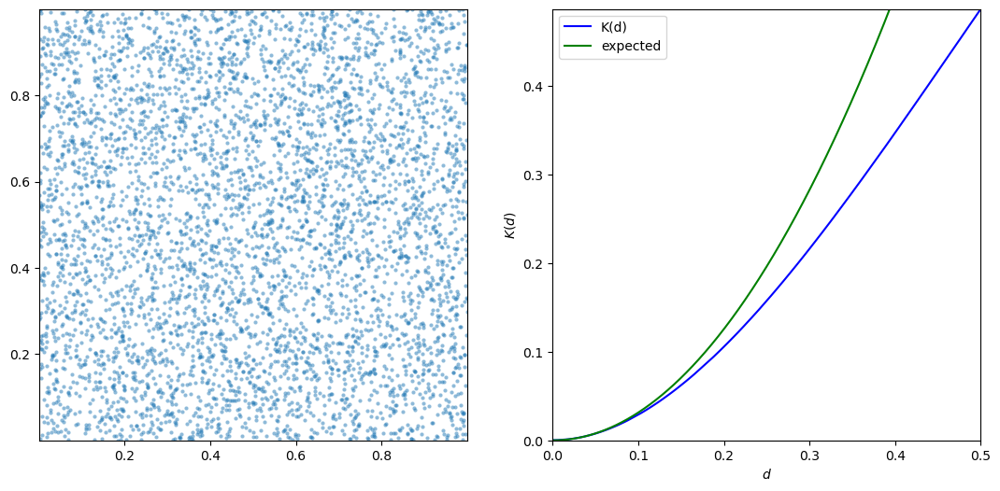

In [18]:
fig,axs = plotK(dxy, Kxy, 0.5)

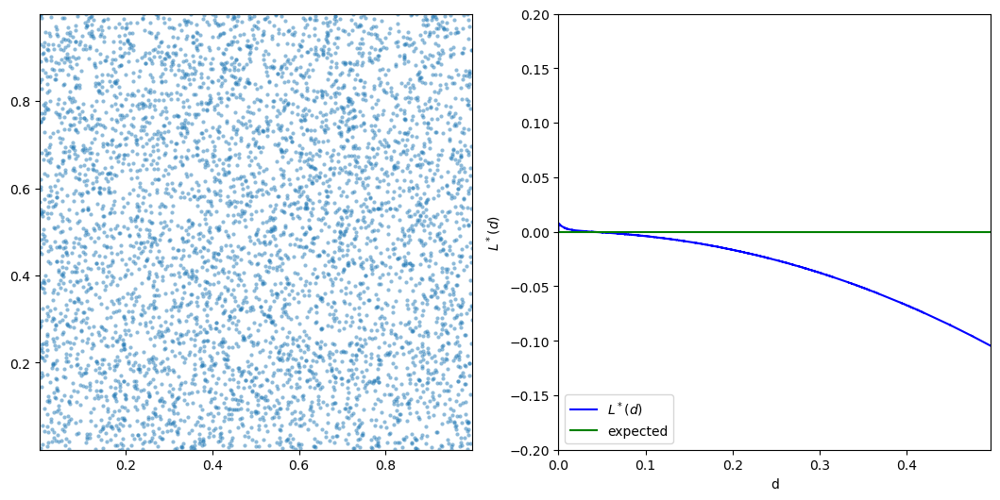

In [19]:
# Besag's L
def Lstar(x, y, A, doplot = False):
    
    (dxy, kxy) = K(x, y, A)
    Lstar = np.sqrt(kxy / np.pi) - dxy
    
    if doplot:
        fig, ax = plt.subplots(ncols = 2, figsize = (13, 6))
        ax[0].scatter(x, y, lw = 0, marker = '.', alpha = 0.5)
        ax[0].set_xlim(min(x), max(x))
        ax[0].set_ylim(min(y), max(y))
        ax[1].plot(dxy, Lstar, c = 'b', label = '$L^*(d)$')
        ax[1].axhline(0, c = 'g', label = 'expected')
        ax[1].set_xlim(0, max(dxy) / np.sqrt(2) / 2.)
        ax[1].set_ylim(-0.2, 0.2)
        ax[1].set_xlabel('d')
        ax[1].set_ylabel('$L^*(d)$')
        ax[1].legend(loc = 3)
    return (dxy, Lstar)

(dxy, Lstarxy) = Lstar(x, y, 1., True)

* **Deviations from expected values are due to edge effects.**
* Note that there are not as many points near the corner or edges as to points near the central areas.
* Normalize via Monte Carlo simulations or correct by tested area vs circle area ratio around each point

### Lieshout-Baddeley $J$ function:

Comparison between inter-event distances G to distances from a fixed point F

$$\Large J(r) = \frac{1-G(r)}{1-F(r)}$$

* J has been shown to be highly resistant to edge effects while still sensitive to clustering structure

* For CSR, $J(r) = 1$, but the converse is not always true

* $J(r) < 1$ indicate clustering and $J > 1$ indicate spatial repulsion

* It inherits the advantages of both $F$ and $G$ for weak and strong clustering processes

/Users/rtrainor/opt/anaconda3/envs/astroML2/lib/python3.12/site-packages/scipy/interpolate/_interpolate.py:479: RuntimeWarning: divide by zero encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
/Users/rtrainor/opt/anaconda3/envs/astroML2/lib/python3.12/site-packages/scipy/interpolate/_interpolate.py:482: RuntimeWarning: invalid value encountered in multiply
  y_new = slope*(x_new - x_lo)[:, None] + y_lo


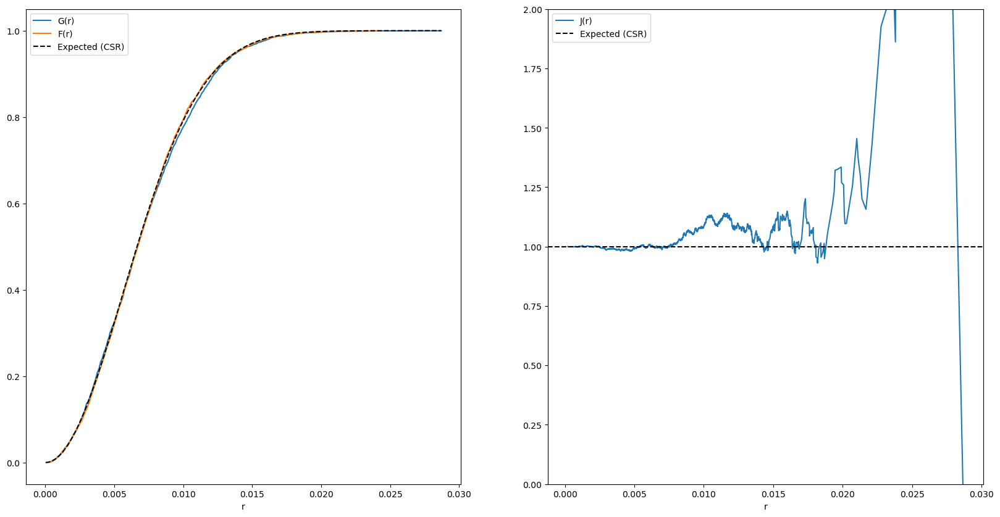

In [20]:
# Lieshout-Baddeley J
def J(x, y, A, doplot = False, Jlims=(0, 2)):
    
    # sorted between point distances
    nnG = np.array(sorted(list(map(lambda i: min(np.sqrt((np.delete(x, i) - x[i])**2
        + (np.delete(y, i) - y[i])**2)), range(len(x))))))
    
    # sorted distances to random points
    nnF = np.array(sorted(list(map(lambda i: min(np.sqrt((x - np.random.random())**2
        + (y - np.random.random())**2)), range(len(x))))))
    
    # build interpolating function for nnG and nnF
    nnGf = interp1d(nnG, np.arange(len(nnG)) / len(nnG), bounds_error = False, fill_value = 'extrapolate')
    nnFf = interp1d(nnF, np.arange(len(nnF)) / len(nnF), bounds_error = False, fill_value = 'extrapolate')
    
    # plot
    fig, ax = plt.subplots(ncols = 2, figsize = (20, 10))
    ax[0].plot(nnG, nnGf(nnG),label='G(r)')
    ax[0].plot(nnF, nnFf(nnF),label='F(r)')
    ax[0].plot(nnG, 1.- np.exp(-np.pi * np.size(x) * nnG**2),color='k',ls='--',label='Expected (CSR)')
    ax[0].set_xlabel('r')
    ax[0].legend()
    
    ax[1].plot(nnG, (1. - nnGf(nnG)) / (1. - nnFf(nnG)),label='J(r)')
    ax[1].axhline(1,color='k',ls='--',label='Expected (CSR)')
    ax[1].set_xlabel('r')
    ax[1].set_ylim(Jlims)
    ax[1].legend()
    

J(x, y, 1., True)

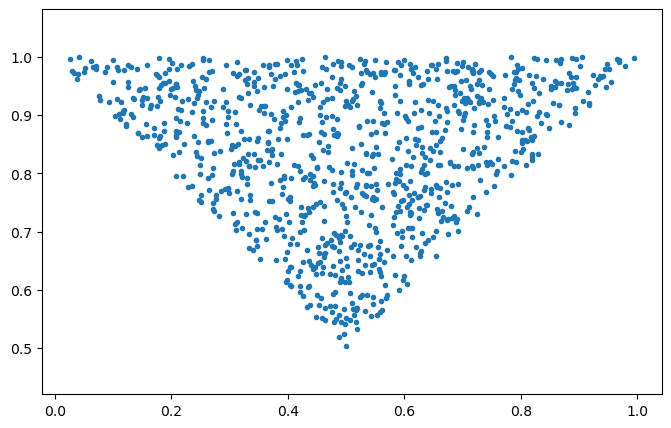

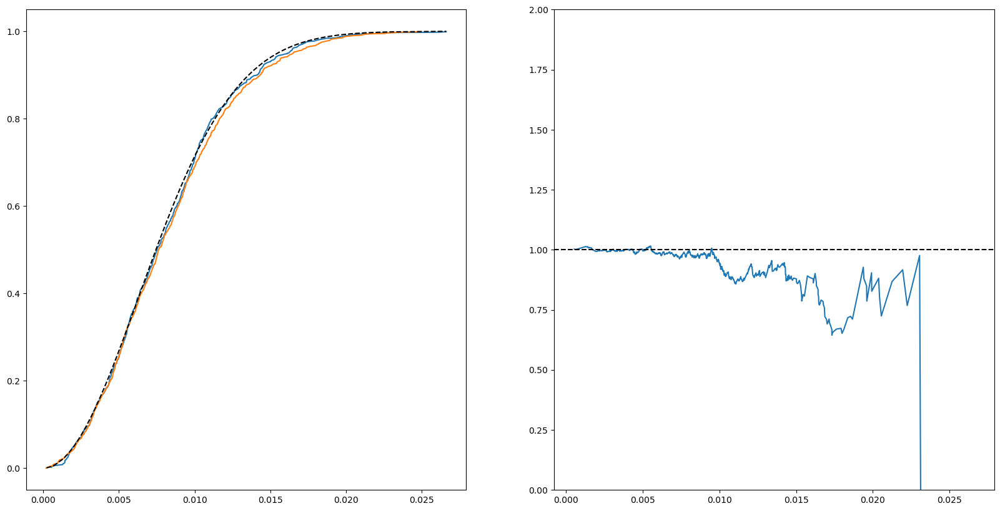

In [21]:
## Simulate data with atypical selection function

n = 4000
(x, y) = (np.random.random(n), np.random.random(n))
mask = (y > (1. - x)) & (x < y) # 1/4th of the square
fig, ax = plt.subplots(figsize=(8,5))
ax.scatter(x[mask], y[mask], marker = '.')
ax.axis('equal')

# Lieshout-Baddeley J
def Jmask(x, y, A, doplot = False, Jlims=(0, 2)):
    
    # sorted between point distances
    nnG = np.array(sorted(list(map(lambda i: min(np.sqrt((np.delete(x, i) - x[i])**2
        + (np.delete(y, i) - y[i])**2)), range(len(x))))))
    
    # sorted distances to random points
    x2, y2 = (np.random.random(n), np.random.random(n))
    mask2 = (y2 > (1. - x2)) & (x2 < y2)
    nnF = np.array(sorted(list(map(lambda i: min(np.sqrt((x - x2[mask2][i])**2
        + (y - y2[mask2][i])**2)), range(sum(mask2))))))
    
    # build interpolating function for nnG and nnF
    nnGf = interp1d(nnG, np.arange(len(nnG)) / len(nnG), bounds_error = False, fill_value = 'extrapolate')
    nnFf = interp1d(nnF, np.arange(len(nnF)) / len(nnF), bounds_error = False, fill_value = 'extrapolate')
    
    # plot
    fig, ax = plt.subplots(ncols = 2, figsize = (20, 10))
    ax[0].plot(nnG, nnGf(nnG),label='G(r)')
    ax[0].plot(nnF, nnFf(nnF),label='F(r)')
    ax[0].plot(nnG, 1.- np.exp(-np.pi * np.size(x) * nnG**2 / A),color='k',ls='--',label='Expected (CSR)')
    
    ax[1].plot(nnG, (1. - nnGf(nnG)) / (1. - nnFf(nnG)))
    ax[1].axhline(1,color='k',ls='--',label='Expected (CSR)')
    ax[1].set_ylim(Jlims)

    

Jmask(x[mask], y[mask], 0.25, True)

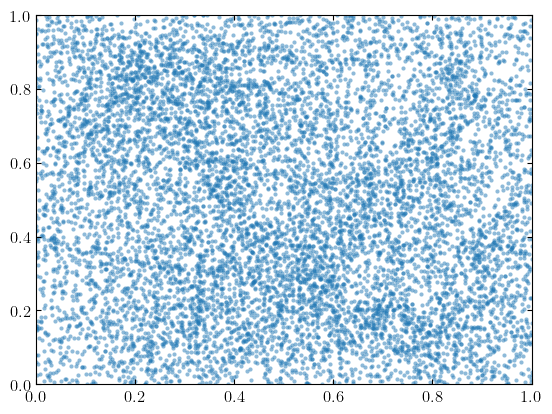

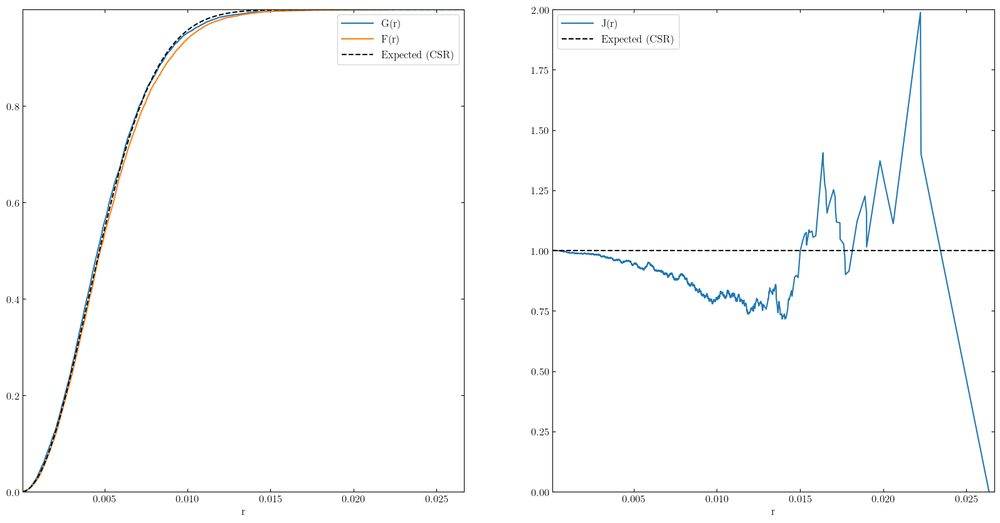

In [40]:
## Simulate clustered data
def gen_random_walks(npts,nseeds,xrange=(0,1),yrange=(0,1)):
    x,y=[[],[]]
    for i in range(nseeds):
        (xi, yi) = (np.cumsum(np.random.normal(0,1,npts)), np.cumsum(np.random.normal(0,1,npts)))
        x.append((xi-np.min(xi))/(np.max(xi)-np.min(xi)))
        y.append((yi-np.min(yi))/(np.max(yi)-np.min(yi)))
    return np.asarray(x).flatten(),np.asarray(y).flatten()

x1,y1 = gen_random_walks(500,10)
x1,y1 = (np.append(x1,np.random.uniform(0,1,5000)),np.append(y1,np.random.uniform(0,1,5000)))
plt.scatter(x1, y1, lw = 0, marker = '.', alpha = 0.5)

J(x1, y1, 1., True)

### Clustering interactions

* It is also possible to measure clustering strength between two or more populations in a survey

* For example, we can use counts of one population around points of a second population:

$$\Large L_{12}^*(d) = \sqrt{\frac{n_2 K_{12}(d) + n_1 K_{21}(d)}{\pi (n_1 + n_2)}} - d$$

* This will give positive values where the two populations are segregated, negative where they are aggregated, and zero where they have no interaction.

* e.g. study the distribution of elliptical and spiral galaxies in rich clusters

## Two-point correlation function

* The two-point correlation function counts the number of objects in annuli around each point rather than counts within circles around each point

* It is related to the differential of the Ripley $K$ function

* Astronomers use almost exclusively the two-point correlation function for galaxy clustering studies.

The two-point correlation function is derived from the joint probability $P_{12}$ that two objects in a spatial point process lie in infinitesimal spheres of volume $dV_1$ and $dV_2$ around two vector locations ${\bf x}_1$ and ${\bf x}_2$:

$$ \Large dP_{12} = \lambda_2({\bf x}_1, {\bf x}_2)~ dV_1~ dV_2$$

where $\lambda_2$ is the second-order product density of the process. 

* In astronomy the two-point correlation function $\xi({\bf d})$ is a function of vectorial distances $\bf d$ between ${\bf x}_1$ and ${\bf x}_2$. It treats $\lambda_2$ as the sum of two components: a uniform process with volume density $\bar{\rho}$ and other a correlated process:

$$\Large dP_{12} = \bar{\rho}^2 [1 + \xi({\bf d})] dV_1 dV_2$$

* $\xi({\bf d})$ measures the **covariance** of the non-uniform structure of the point distribution.

* In most studies the process is assumed to be stationary and isotropic, which gives:

$$\Large \xi(d) = \frac{\lambda_2(d)}{\bar{\rho}^2} - 1 $$

* In statistics $\xi(d) + 1$ is called the **pair correlation function**, which is the differential of Ripley's $K$ function:

$$ \Large \xi(d) + 1 = \frac{K'(d)}{p \nu_p d^{p - 1}} = \frac{K'(d)}{2 \pi d}~~~~{\rm for}~~p=2$$

* while $\xi$ is computed in annuli specified by the scientist, $K$ is computed for all distances $d$ without binning

* the two-point correlation contains the same information as the $K$ function and it is not widely used by statisticians or scientists in other fields, largely because it is a differential rather than cumulative estimator, i.e. it requires binning.

* Illian et al. 2008: *while the two-point correlation contains the same statistical information as the $K$ or $L$ functions, it offers the information in a way that it is easier to understand, in particular for beginners*

### Methods to compute $\xi(d)$

* Methods combine the concepts of the $G$ and $F$ functions, which measure points around measured points and around random locations, respectively

* They use Montecarlo simulations of CSR distributions

* Simulation can include complicated selection effects such as magnitude limits convolved with the galaxy luminosity function, redshifted spectra or intrinsic color evolution

#### **Peebles-Hause (1974)**: 

$$ \Large \hat{\xi_{PH}} = \biggl( \frac{n_{\rm CSR}}{n} \biggr)^2 \frac{DD(d)}{RR(d)} - 1$$

where $DD(r)$ and $RR(d)$ are the number of points around observed or CSR simulated points, respectively, where $n_{\rm CSR} \gg n$, and where the counts are obtained in annuli ($d$, $d$ + $\Delta d$) around each location. Note that replacing $\biggl(\frac{n_{\rm CSR}}{n}\biggr)^2$ for $\frac{n_{\rm CSR} (n_{\rm CSR} - 1)}{n (n - 1)}$ makes the estimator unbiased for a Poisson process.

#### **Davis-Peebles (1983)**:

$$ \Large \hat{\xi_{DP}} = \frac{n_{\rm CSR}}{n} \frac{DD(d)}{DR(d)} - 1$$

where $DR(d)$ is the number of pairs between the observed and simulated CSR distributions in the ($d$, $d$ + $\Delta d$) annulus

#### **Hamilton (1993)**:

$$ \Large \hat{\xi_{H}} = \frac{DD(d)~ RR(d)}{DR(d)^2} - 1$$

#### **Landy-Szalay (1993)**:

$$ \Large \hat{\xi_{LS}} = 1 + \biggl( \frac{n_{\rm CSR}}{n} \biggr)^2 \frac{DD(d)}{RR(d)} - 2 \frac{n_{\rm CSR}}{n} \frac{DR(d)}{RR(d)}$$

* These estimators can be extended to higher orders, such as the three point correlation function

* The variance of the two-point correlation estimator is often estimated with a normal approximation:

$$ \Large \hat{var}[\xi(d)] = \frac{[1 + \xi(d)]^2}{DD(d)}$$

(0.0, 1.0)

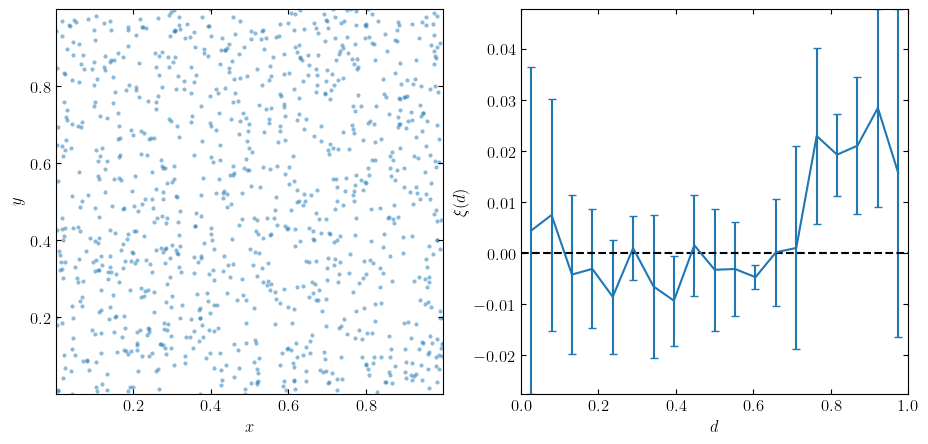

In [46]:
# Calculate 2-point correlation function for simulated CSD

from astroML.correlation import bootstrap_two_point

np.random.seed(0)
X = np.random.random((1000, 2))
bins = np.linspace(0, 1, 20)

corr, dcorr = bootstrap_two_point(X, bins, Nbootstrap=5)
# np.allclose(corr, 0, atol=2 * dcorr)
fig, ax = plt.subplots(ncols=2,figsize=(11,5))
ax[0].scatter(*X.T, lw = 0, marker = '.', alpha = 0.5)
ax[0].set_ylabel('$y$')
ax[0].set_xlabel('$x$')
ax[1].errorbar((bins[:-1] + bins[1:]) / 2., corr, yerr = dcorr)
ax[1].axhline(0,color='k',ls='--')
ax[1].set_ylabel('$\\xi(d)$')
ax[1].set_xlabel('$d$')
ax[1].set_xlim(0,1)

(0.0, 1.0)

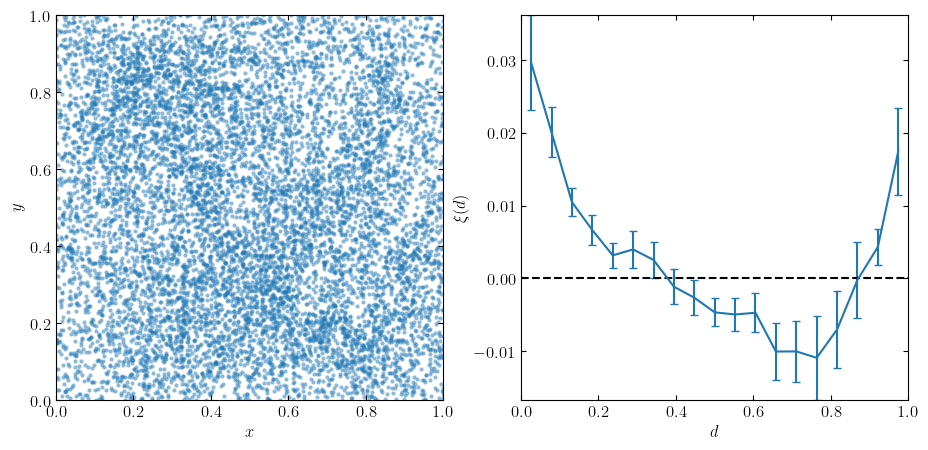

In [47]:
# Repeat for simulated clustered data

X1 = np.asarray([x1,y1]).T
bins = np.linspace(0, 1, 20)
corr, dcorr = bootstrap_two_point(X1, bins, Nbootstrap=5)

# np.allclose(corr, 0, atol=2 * dcorr)
fig, ax = plt.subplots(ncols=2,figsize=(11,5))
ax[0].scatter(*X1.T, lw = 0, marker = '.', alpha = 0.5)
ax[0].set_ylabel('$y$')
ax[0].set_xlabel('$x$')
ax[1].errorbar((bins[:-1] + bins[1:]) / 2., corr, yerr = dcorr)
ax[1].axhline(0,color='k',ls='--')
ax[1].set_ylabel('$\\xi(d)$')
ax[1].set_xlabel('$d$')
ax[1].set_xlim(0,1)

In [25]:
# Author: Jake VanderPlas
# License: BSD
#   The figure produced by this code is published in the textbook
#   "Statistics, Data Mining, and Machine Learning in Astronomy" (2013)
#   For more information, see http://astroML.github.com
#   To report a bug or issue, use the following forum:
#    https://groups.google.com/forum/#!forum/astroml-general
import numpy as np
from matplotlib import pyplot as plt

from astroML.decorators import pickle_results
from astroML.datasets import fetch_sdss_specgals
from astroML.correlation import bootstrap_two_point_angular

#----------------------------------------------------------------------
# This function adjusts matplotlib settings for a uniform feel in the textbook.
# Note that with usetex=True, fonts are rendered with LaTeX.  This may
# result in an error if LaTeX is not installed on your system.  In that case,
# you can set usetex to False.
from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=12, usetex=True)

/Users/rtrainor/opt/anaconda3/envs/astroML2/lib/python3.12/site-packages/astroML/linear_model/linear_regression_errors.py:10: UserWarning: LinearRegressionwithErrors requires PyMC3 to be installed
  warnings.warn('LinearRegressionwithErrors requires PyMC3 to be installed')


In [26]:
#------------------------------------------------------------
# Get data and do some quality cuts
data = fetch_sdss_specgals()
m_max = 17.7

# redshift and magnitude cuts
data = data[data['z'] > 0.08]
data = data[data['z'] < 0.12]
data = data[data['petroMag_r'] < m_max]

# RA/DEC cuts
RAmin, RAmax = 140, 220
DECmin, DECmax = 5, 45
data = data[data['ra'] < RAmax]
data = data[data['ra'] > RAmin]
data = data[data['dec'] < DECmax]
data = data[data['dec'] > DECmin]

ur = data['modelMag_u'] - data['modelMag_r']
flag_red = (ur > 2.22)
flag_blue = ~flag_red

data_red = data[flag_red]
data_blue = data[flag_blue]

print("data size:")
print("  red gals: ", len(data_red))
print("  blue gals:", len(data_blue))

data size:
  red gals:  38017
  blue gals: 16883


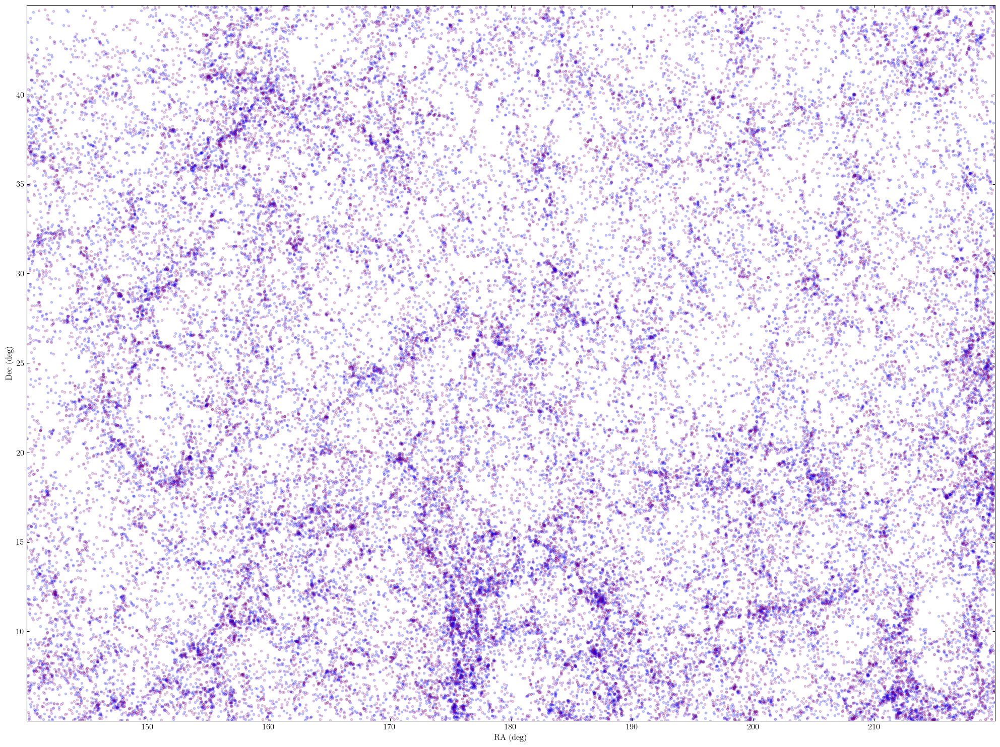

In [27]:
fig, ax = plt.subplots(figsize = (20, 15))
ax.scatter(data_red['ra'], data_red['dec'], marker = '.', alpha = 0.2, c = 'r')
ax.scatter(data_blue['ra'], data_blue['dec'], marker = '.', alpha = 0.2, c = 'b')
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
plt.tight_layout()

In [28]:
#------------------------------------------------------------
# Set up correlation function computation
#  This calculation takes a long time with the bootstrap resampling,
#  so we'll save the results.
@pickle_results("data/correlation_functions.pkl")
def compute_results(Nbins=16, Nbootstraps=10,  method='landy-szalay', rseed=0):
    np.random.seed(rseed)
    bins = 10 ** np.linspace(np.log10(1. / 60.), np.log10(6), 16)

    results = [bins]
    for D in [data_red, data_blue]:
        results += bootstrap_two_point_angular(D['ra'],
                                               D['dec'],
                                               bins=bins,
                                               method=method,
                                               Nbootstraps=Nbootstraps)

    return results

In [29]:
(bins, r_corr, r_corr_err, r_bootstraps,
 b_corr, b_corr_err, b_bootstraps) = compute_results()

bin_centers = 0.5 * (bins[1:] + bins[:-1])

@pickle_results: computing results and saving to 'correlation_functions.pkl'


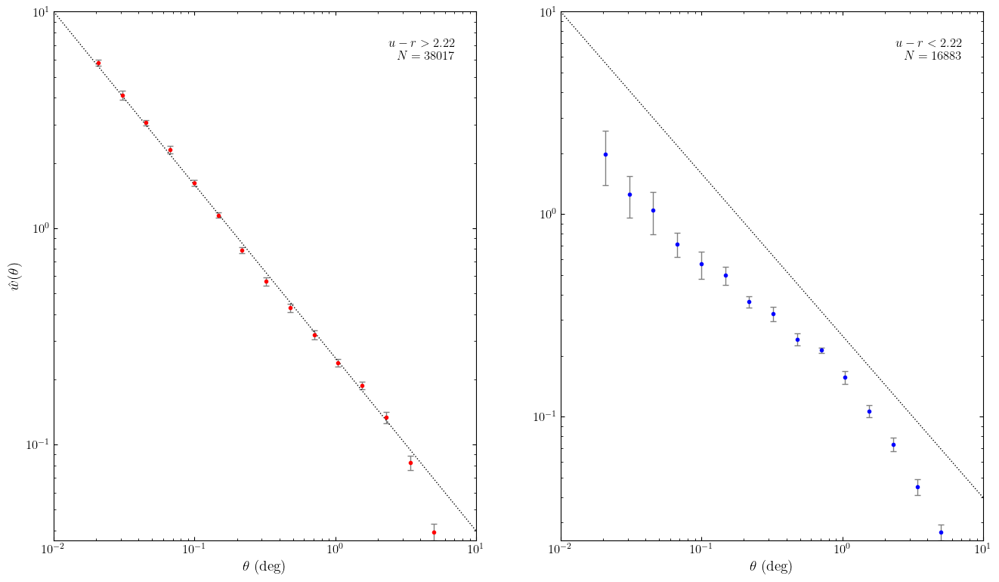

In [30]:
#------------------------------------------------------------
# Plot the results
corr = [r_corr, b_corr]
corr_err = [r_corr_err, b_corr_err]
bootstraps = [r_bootstraps, b_bootstraps]
labels = ['$u-r > 2.22$\n$N=%i$' % len(data_red),
          '$u-r < 2.22$\n$N=%i$' % len(data_blue)]

fig = plt.figure(figsize=(15, 10))
fig.subplots_adjust(bottom=0.2, top=0.9,
                    left=0.13, right=0.95)

colors = ['r','b']
for i in range(2):
    ax = fig.add_subplot(121 + i, xscale='log', yscale='log')

    ax.errorbar(bin_centers, corr[i], corr_err[i],
                fmt='.', color=colors[i], ecolor='gray', lw=1)

    t = np.array([0.01, 10])
    ax.plot(t, 10 * (t / 0.01) ** -0.8, ':k', linewidth=1)

    ax.text(0.95, 0.95, labels[i],
            ha='right', va='top', transform=ax.transAxes)
    ax.set_xlabel(r'$\theta$ (deg)', fontsize = 14)
    if i == 0:
        ax.set_ylabel(r'$\hat{w}(\theta)$', fontsize = 14)

The two-point correlation function of SDSS spectroscopic galaxies in the range 0.08 < z < 0.12, with m < 17.7. This is the same sample for which the luminosity function is computed in figure 4.10. Errors are estimated using ten bootstrap samples. Dotted lines are added to guide the eye and correspond to a power law proportional to $\theta^{-0.8}$. Note that the red galaxies (left panel) are clustered more strongly than the blue galaxies (right panel).

**Example**:  Detection of baryonic acoustic oscillations in the two-point correlation function of galaxies
![alt text](BAOobsv.png "original")

<!-- ![alt text](CMB.jpg "original") -->


# Power spectrum

Consider CMB anisotropies and its spherical harmonics expansion

$$\Large \frac{\delta T}{T_0}(\theta, ~\phi) = \sum a_{l, m} Y_{l, m}(\theta, \phi)$$

defining 

$$\Large C_l \equiv \frac{1}{2 l + 1} \sum_m <|a_{l, m}|^2>$$

it is possible to show that for $l \gg 1$, the expectation value for the squared deviation from the average, i.e. the variance, is 

$$\Large \frac{l (l+1) C_l}{2 \pi}$$

![alt text](images/CMB.jpg "original")
![alt text](images/Power_Spectrum_Blah.jpg "original")


# Spatial data representation

* A common problem in astrophysics is to search for some point near a given position in the sky in a multidimensional space

* Not obvious way to sort the data to efficiently search for the required point (naive search if $\mathcal{O}(n^2)$)

* For this problem there are a number of multidimensional tree structures which can be used for a nearest neighbor search

## Vornoi tesselation
- Conceptually simple: identifies region closest to each point in the set
- Constructed from perpendicular bisectors of [Delaunay triangulation](https://en.wikipedia.org/wiki/Delaunay_triangulation)
- **Storage issues**: number of verticies is complex to store, especially in high dimensions

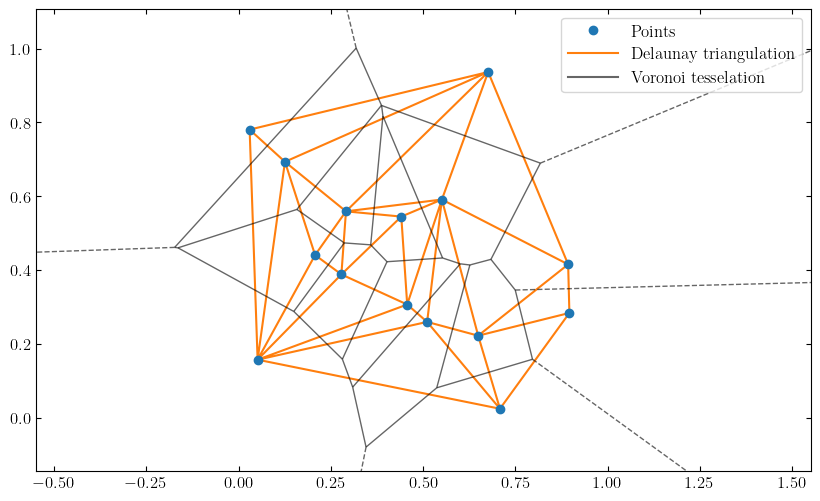

In [31]:
from scipy.spatial import Delaunay, Voronoi, voronoi_plot_2d

np.random.seed(3)
n=15
points = np.array(list(zip(np.random.random(n), np.random.random(n))))
tri = Delaunay(points)
vor = Voronoi(points)

fig,ax=plt.subplots(figsize=(10,6))
ax.axis('equal')
x, y = tri.points.T
ax.plot(x, y, 'o',label='Points')
ax.triplot(x, y, tri.simplices.copy(),label='Delaunay triangulation')
voronoi_plot_2d(vor,ax=ax,show_vertices=False,show_points=False,line_colors='k',line_alpha=0.6)
ax.plot([],[],'k-',alpha=0.6,label='Voronoi tesselation')
ax.set_xlim([-0.55,1.55])
ax.legend();


## Quad-trees and Oct-trees

* A quad-tree is a simple data structure used to arrange two-dimensional data, in which each tree has exactly four children, representing its four quadrants.

* Tree building takes $\mathcal{O}(n \log(n))$ and search takes $\mathcal{O}(\log(n))$, which is true for all trees below

* An oct-tree is the three-dimensional version of a quad-tree

![quad tree](images/quadtree.png "original")

## kd-trees

* It is the generalization of the quad-tree and oct-trees to higher dimensions, where the strategy of dividing in quadrants becomes unfeasible.

* For $D=10$ dimensions each node of the tree would have $2^{10}=1024$ children, so having just two levels would require about $10^6$ nodes. For $D=100$ and assuming 1 byte per node, we would require $10^{15}$ PB of storage!

* A kd-tree is a binary tree, where each node has only 2 children. 

* The split position is chosen to better represent the data.

![kd tree](images/kdtree.png "original")

In [32]:
from scipy.spatial import cKDTree
np.random.seed(0)
X = np.random.random((1000, 3))
kdt = cKDTree(X) # build the KDTree
%timeit kdt.query(X, k=2) # query for two neighbors!
result = kdt.query(X, k=2)
print(np.shape(result))

1.04 ms ± 12.9 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
(2, 1000, 2)


In [33]:
X = np.random.random((100000, 3))
kdt = cKDTree(X) # build the KDTree
%timeit kdt.query(X, k=2) # query for two neighbors!
result = kdt.query(X, k=2)
print(np.shape(result))

241 ms ± 53.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
(2, 100000, 2)


## Ball-trees

* Because of the rectilinear splitting of the data, as the number of dimensions increase kd-trees also suffer from the "curse of dimensionality"

* Ball-trees use the triangle inequality:

$$ \Large D(x1, x2) + D(x2, x3) \le D(x1, x3)$$

* Rather than building rectilinear nodes in $D$ dimensions, ball-trees build hyperspherical nodes

* Each node is defined by a centroid ${\bf c}_i$  and a radius $r_i$, such that the distance $D({\bf y}, {\bf c}_i) \le r_i$ for every point $\bf y$

* It is easy to show that for every point ${\bf x}$ outside the node and a point ${\bf y}$ inside the node:

$$ \Large D({\bf x}, {\bf c}_i) - r_i \le D({\bf x}, {\bf y}) \le D({\bf x}, {\bf c}_i) + r_i$$

* Using this information we can eliminate a large part of the dataset after a single distance computation


![visualization of a ball tree](images/balltree.png "original")
![structure of a ball tree](images/balls.png "original")

In [34]:
from sklearn.neighbors import BallTree
np.random.seed(0)
X = np.random.random((1000, 3))
bt = BallTree ( X ) # build the Ball Tree
%timeit bt.query(X, k = 2)

X = np.random.random((10000, 3))
bt = BallTree ( X ) # build the Ball Tree
%timeit bt.query(X, k = 2)

2.04 ms ± 98 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
48 ms ± 16.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [35]:
# Try again with brute force
def brute_nearest_neighbors(X,k):
    ind,d = ([],[])
    for x in X:
        dsq = np.sum((x-X)**2,axis=1)
        idx = np.argsort(dsq)[1:k+1]
        ind.append(idx)
        d.append(np.sqrt(dsq[idx]))
    return ind,d

X = np.random.random((1000, 3))
%timeit brute_nearest_neighbors(X,2)

X = np.random.random((10000, 3))
%timeit brute_nearest_neighbors(X,2)

49.2 ms ± 8.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
8.5 s ± 1.03 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [36]:
n=int(1e5)
X = np.random.random((n, 3))
print(f'Building the ball tree (n={n}):')
%timeit BallTree ( X ) # build the Ball Tree 
bt = BallTree ( X )
print(f'Querying the ball tree (n={n}):')
%timeit bt.query(X, k = 2)

Building the ball tree (n=100000):
50.7 ms ± 13.7 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Querying the ball tree (n=100000):
801 ms ± 91.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [37]:
# %timeit bt.query(X[:10], k = 1)

## HEALPix

Hierarchical Equal Area isoLatitude Pixelisation of a 2-sphere.


![diagram of HEALPix pixelization of a sphere](images/healpix.png "original")

![Table of HEALPix resolutions](images/healpix_nside.png "original")

See https://healpy.readthedocs.io/en/latest/tutorial.html

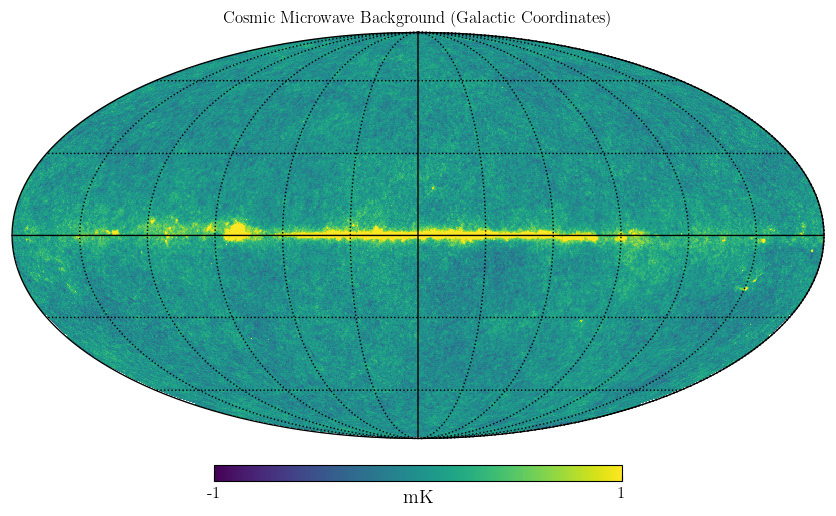

In [48]:
# HEALpy example with CMB

import healpy as hp

# read files downloade from following URLs:
# http://lambda.gsfc.nasa.gov/data/map/dr4/skymaps/7yr/raw/wmap_band_iqumap_r9_7yr_W_v4.fits
# http://lambda.gsfc.nasa.gov/data/map/dr4/ancillary/masks/wmap_temperature_analysis_mask_r9_7yr_v4.fits
wmap_map_I = hp.read_map("data/wmap_band_iqumap_r9_7yr_W_v4.fits")

hp.mollview(
    wmap_map_I,
    title="Cosmic Microwave Background (Galactic Coordinates)",
    unit="mK",
    # norm="hist",
    min=-1,
    max=1,
)
hp.graticule()


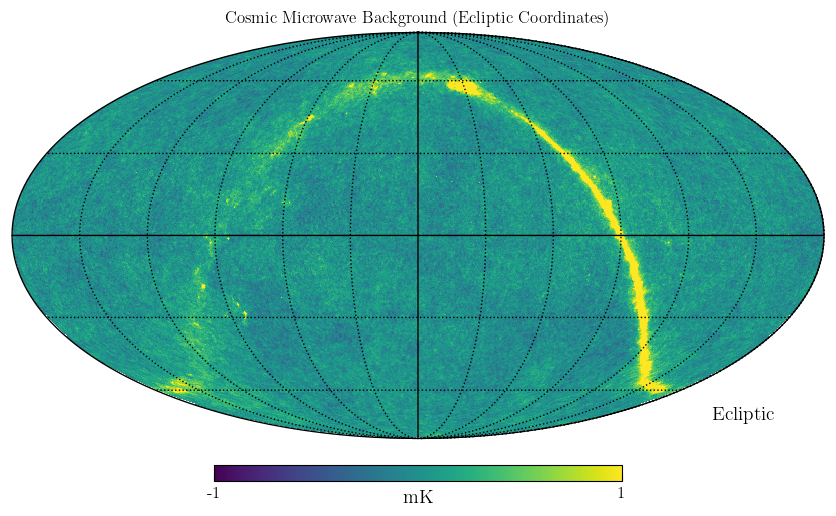

In [49]:
hp.mollview(
    wmap_map_I,
    coord=["G", "E"],
    title="Cosmic Microwave Background (Ecliptic Coordinates)",
    unit="mK",
    # norm="hist",
    min=-1,
    max=1,
)
hp.graticule()


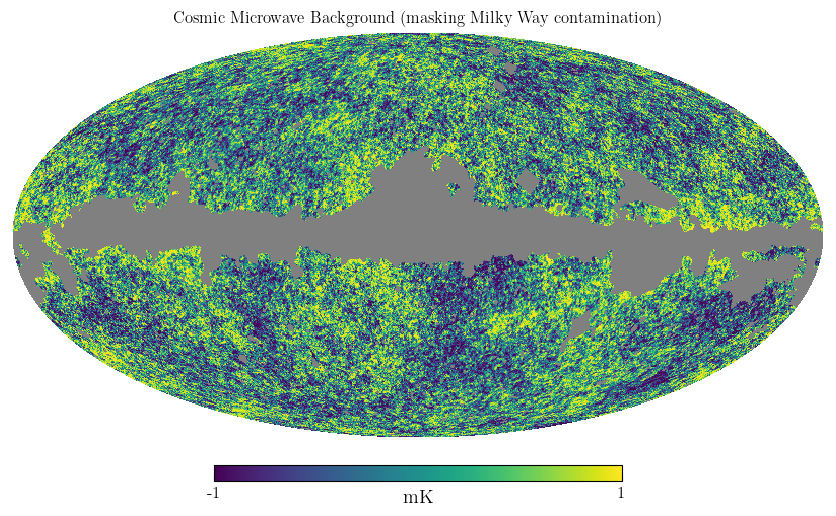

In [49]:
mask = hp.read_map("data/wmap_temperature_analysis_mask_r9_7yr_v4.fits").astype(np.bool_)
wmap_map_I_masked = hp.ma(wmap_map_I)
wmap_map_I_masked.mask = np.logical_not(mask)

hp.mollview(wmap_map_I_masked.filled(),
    title="Cosmic Microwave Background (masking Milky Way contamination)",
    unit="mK",
    norm="hist",
    min=-1,
    max=1,
)


In [ ]:
# # Warning: SLOW!!!

# LMAX = 1024
# cl = hp.anafast(wmap_map_I_masked.filled(), lmax=LMAX)
# ell = np.arange(len(cl))

# plt.figure(figsize=(10, 5))
# plt.plot(ell, ell * (ell + 1) * cl)
# plt.xlabel("$\ell$")
# plt.ylabel("$\ell(\ell+1)C_{\ell}$")
# plt.grid()